# Aula 1

In [1]:
import cv2
print(cv2.__version__)

4.11.0


do instrutor era 3.4.3

In [2]:
import dlib
print(dlib.__version__)

20.0.1


do instrutor era 19.18.0

In [3]:
import matplotlib.pyplot as plt
import seaborn

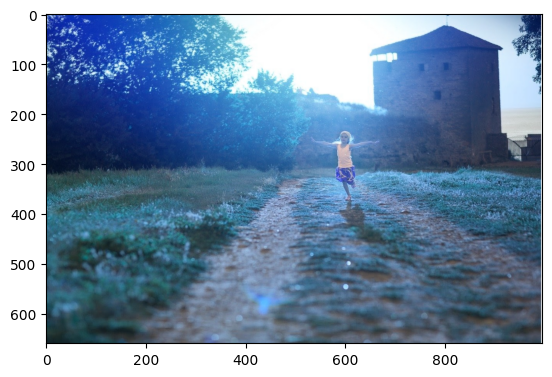

In [4]:
image = cv2.imread("images/px-girl.jpg")
plt.imshow(image)

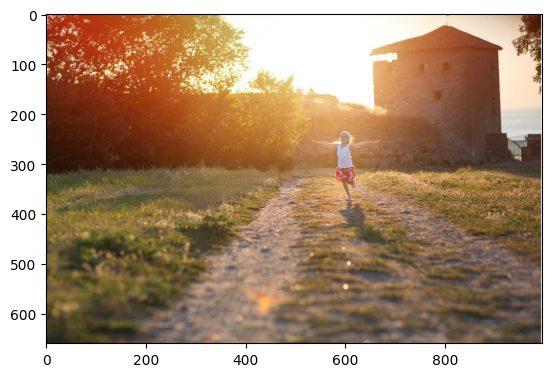

In [5]:
image_rbg = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
plt.imshow(image_rbg)

In [6]:
image_rbg.shape

(660, 995, 3)

roi = region of interest

Text(0.5, 1.0, 'Corpo inteiro')

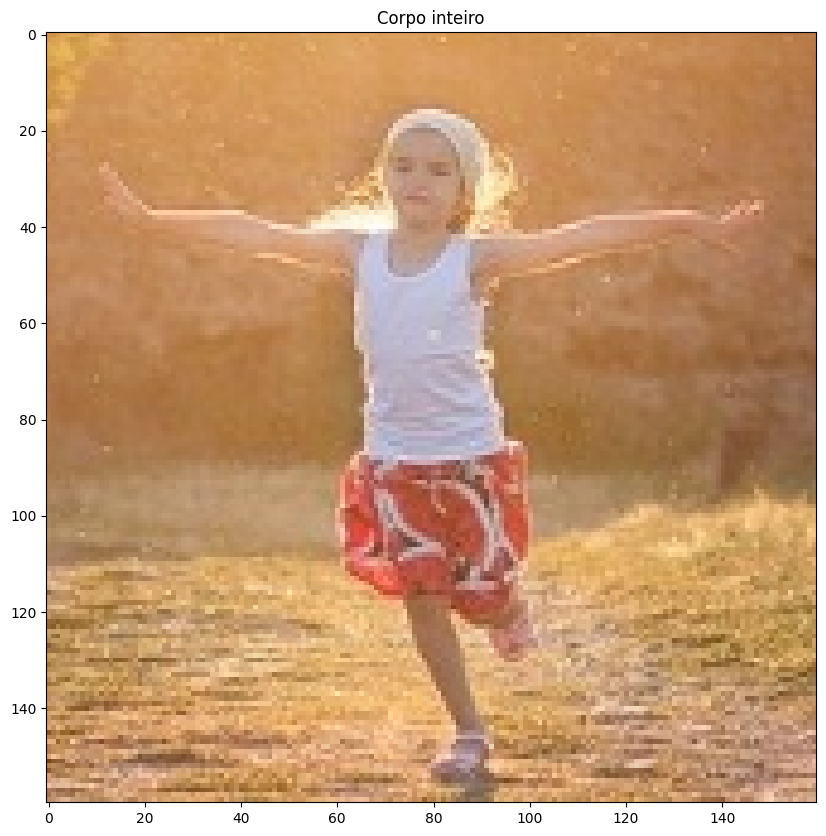

In [7]:
roi = image_rbg[220:380, 520:680]
plt.figure(figsize=(20,10))
plt.imshow(roi)
plt.title("Corpo inteiro")

Text(0.5, 1.0, 'Corpo inteiro')

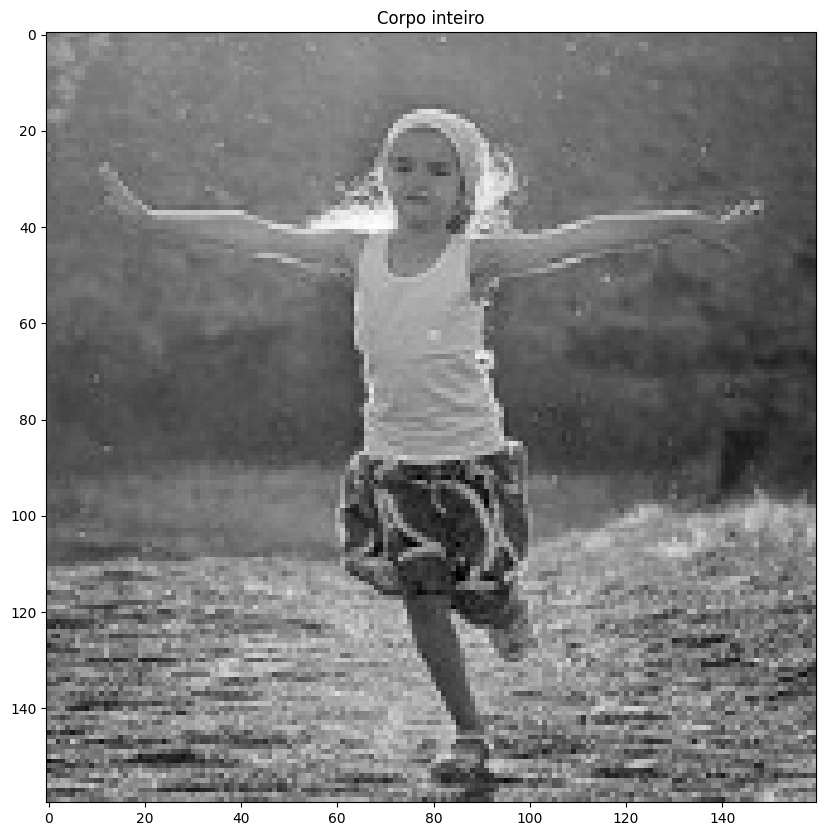

In [8]:
roi_gray = cv2.cvtColor(roi, cv2.COLOR_RGB2GRAY)

plt.figure(figsize=(20,10))
plt.imshow(roi_gray, cmap="gray")
plt.title("Corpo inteiro")

Text(0.5, 1.0, 'Corpo inteiro')

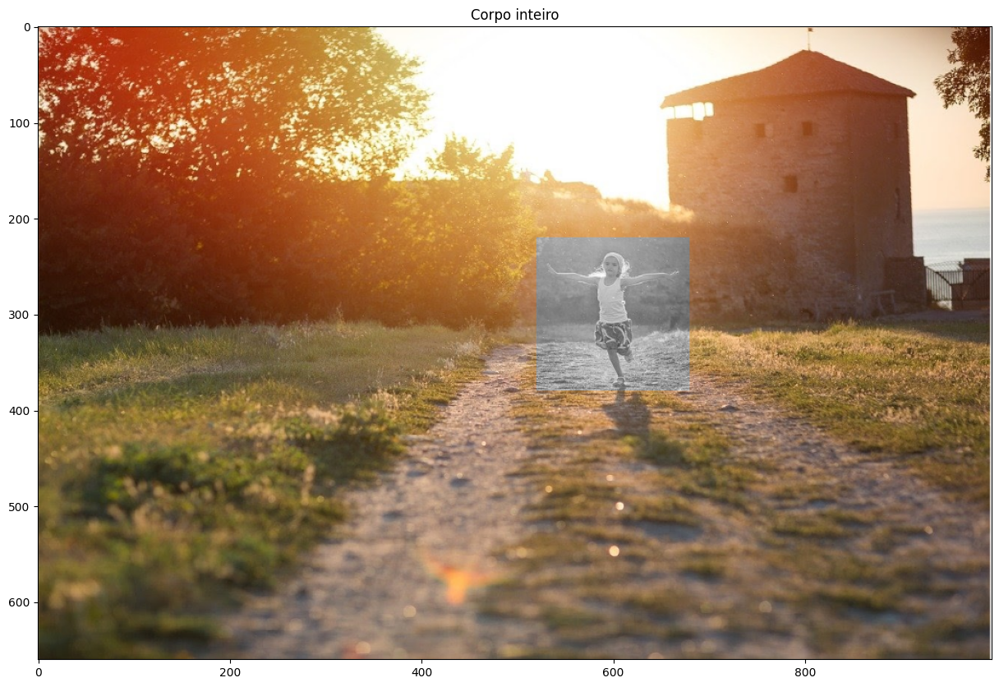

In [9]:
roi_rgb = cv2.cvtColor(roi_gray, cv2.COLOR_GRAY2RGB)
image_rbg[220:380, 520:680] = roi_rgb
plt.figure(figsize=(20,10))
plt.imshow(image_rbg)
plt.title("Corpo inteiro")

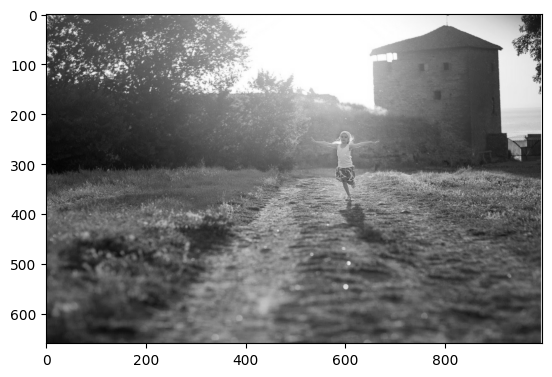

In [10]:
image_gray = cv2.cvtColor(image_rbg, cv2.COLOR_RGB2GRAY)
plt.imshow(image_gray, cmap="gray")

In [11]:
image_gray.shape

(660, 995)

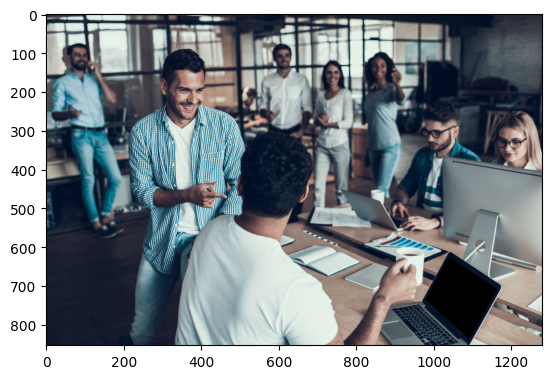

In [12]:
image = cv2.imread("images/px-people_0.jpg")
image_rbg = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
plt.imshow(image_rbg)

In [13]:
image_rbg.shape

(854, 1280, 3)

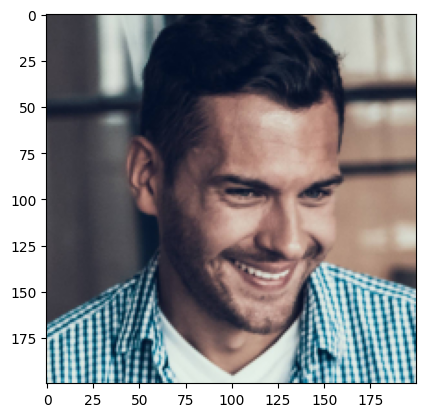

In [14]:
image_roi = image_rbg[100:300, 250:450]
plt.imshow(image_roi)

In [15]:
image_roi_bgr = cv2.cvtColor(image_roi, cv2.COLOR_RGB2BGR)
cv2.imwrite("images/outputs/image_roi.png", image_roi_bgr)

True

# Aula 2

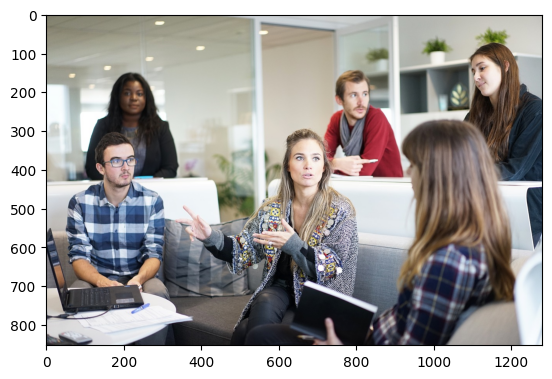

In [16]:
image = cv2.imread("images/px-people.jpg")
image_rbg = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
plt.imshow(image_rbg)

In [17]:
image_gray = cv2.cvtColor(image_rbg, cv2.COLOR_RGB2GRAY)

In [18]:
classifier = cv2.CascadeClassifier(
    cv2.data.haarcascades + "haarcascade_frontalface_default.xml"
)

print(classifier.empty())  # deve dar False

False


In [19]:
faces = classifier.detectMultiScale(image_gray, scaleFactor=1.3, minNeighbors=5)
len(faces)

5

existem outras opcoes de classificadores

In [20]:
import cv2

print(cv2.data.haarcascades)

c:\Users\Vitoria\anaconda3\envs\openfull\lib\site-packages\cv2\data\


In [21]:
import cv2
import os

path = cv2.data.haarcascades

files = os.listdir(path)

for f in files:
    print(f)

haarcascade_eye.xml
haarcascade_eye_tree_eyeglasses.xml
haarcascade_frontalcatface.xml
haarcascade_frontalcatface_extended.xml
haarcascade_frontalface_alt.xml
haarcascade_frontalface_alt2.xml
haarcascade_frontalface_alt_tree.xml
haarcascade_frontalface_default.xml
haarcascade_fullbody.xml
haarcascade_lefteye_2splits.xml
haarcascade_license_plate_rus_16stages.xml
haarcascade_lowerbody.xml
haarcascade_profileface.xml
haarcascade_righteye_2splits.xml
haarcascade_russian_plate_number.xml
haarcascade_smile.xml
haarcascade_upperbody.xml
__init__.py
__pycache__


Nem todos são bons hoje em dia 😅

Haar Cascades são meio antigos — funcionam, mas:
- sensíveis à iluminação
- podem errar bastante
- precisam de ajuste de parâmetros

trabalhando regioes de interesse

In [22]:
faces[0]

array([1088,  102,  101,  101])

In [23]:
image_faces_noted = image_rbg.copy()

In [24]:
for (x, y, w, h) in faces:
    cv2.rectangle(image_faces_noted, (x,y), (x+w, y+h), (255, 255, 0), 2)

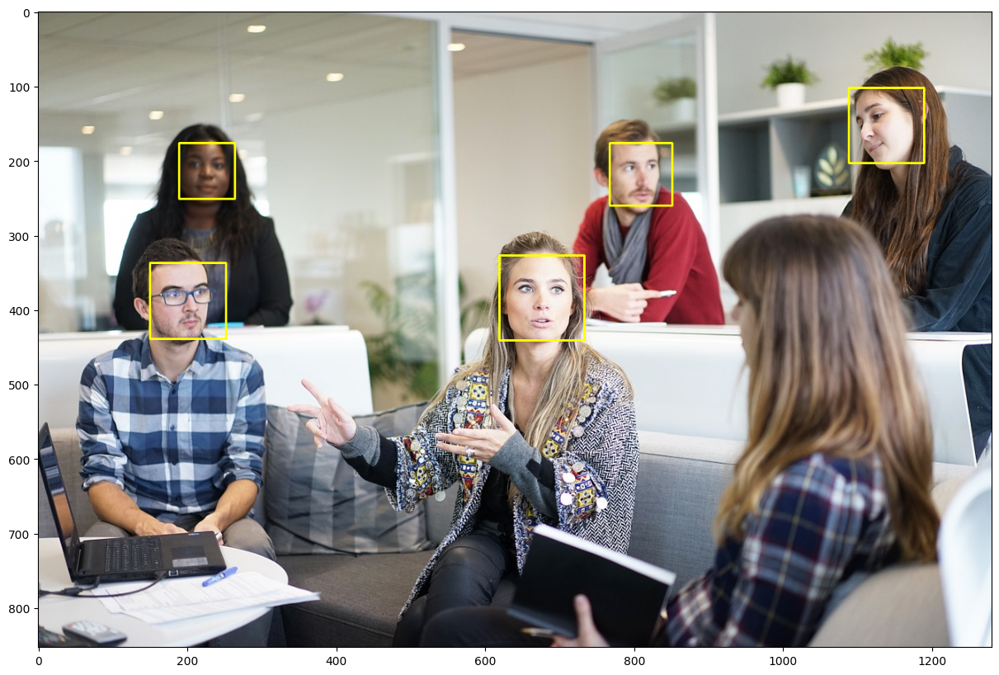

In [25]:
plt.figure(figsize=(20,10))
plt.imshow(image_faces_noted)

In [26]:
face_image = 0

for (x, y, w, h) in faces:
    face_image += 1
    image_roi = image_faces_noted[y:y+h, x:x+w]
    image_roi = cv2.cvtColor(image_roi, cv2.COLOR_RGB2BGR)
    cv2.imwrite("images/outputs/face_" + str(face_image) + ".png", image_roi)

# Aula 3

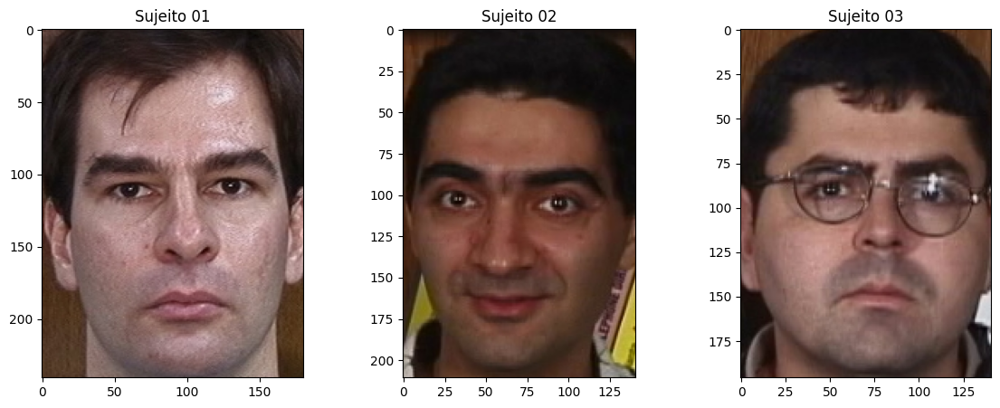

In [27]:
imagem_face_1 = cv2.imread("images/cropped_faces/s01_01.jpg")
imagem_face_1 = cv2.cvtColor(imagem_face_1, cv2.COLOR_BGR2RGB)

imagem_face_2 = cv2.imread("images/cropped_faces/s02_01.jpg")
imagem_face_2 = cv2.cvtColor(imagem_face_2, cv2.COLOR_BGR2RGB)

imagem_face_3 = cv2.imread("images/cropped_faces/s03_01.jpg")
imagem_face_3 = cv2.cvtColor(imagem_face_3, cv2.COLOR_BGR2RGB)

plt.figure(figsize=(14,5))
plt.subplot(131)
plt.title("Sujeito 01")
plt.imshow(imagem_face_1)
plt.subplot(132)
plt.title("Sujeito 02")
plt.imshow(imagem_face_2)
plt.subplot(133)
plt.title("Sujeito 03")
plt.imshow(imagem_face_3)

plt.show()

In [28]:
print(f"Shape da Face 01: {imagem_face_1.shape}")
print(f"Shape da Face 02: {imagem_face_2.shape}")
print(f"Shape da Face 03: {imagem_face_3.shape}")

Shape da Face 01: (241, 181, 3)
Shape da Face 02: (211, 141, 3)
Shape da Face 03: (196, 141, 3)


In [29]:
from os import  listdir, path, makedirs
from os.path import isfile, join
import shutil

In [30]:
faces_path = "images/cropped_faces/"
faces_files_list = [f for f in listdir(faces_path) if isfile(join(faces_path, f))]

In [31]:
faces_files_list[0]

's01_01.jpg'

In [32]:
len(faces_files_list)

750

In [33]:
faces_path_train = "images/train/"
faces_path_test = "images/test/"

if not path.exists(faces_path_train):
    makedirs(faces_path_train)
    
if not path.exists(faces_path_test):
    makedirs(faces_path_test)

for file in faces_files_list:
    person = file[1:3]
    number = file[4:6]

    if int(number) <= 10:
        shutil.copyfile(faces_path + file, faces_path_train + file)
    else:
        shutil.copyfile(faces_path + file, faces_path_test + file)

redimencionar as imagens e converter para escala de cinza

In [34]:
def process_images(image_path):
    image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)
    image = cv2.resize(image, (200, 200), interpolation=cv2.INTER_LANCZOS4)
    return image

In [35]:
faces_list_train = [f for f in listdir(faces_path_train) if isfile(join(faces_path_train, f))]
faces_list_test = [f for f in listdir(faces_path_test) if isfile(join(faces_path_test, f))]

In [36]:
len(faces_list_train)

500

In [37]:
faces_list_train[0]

's01_01.jpg'

In [38]:
faces_list_test[0]

's01_11.jpg'

In [39]:
training_data, subjects = [], []

In [40]:
for i, file in enumerate(faces_list_train):
    image_path = faces_path_train + file
    image = process_images(image_path)
    training_data.append(image)
    subject = file[1:3]
    subjects.append(int(subject))
    

In [41]:
len(subjects)

500

In [42]:
testing_data, subjects_test = [], []

for i, file in enumerate(faces_list_test):
    image_path = faces_path_test + file
    image = process_images(image_path)
    testing_data.append(image)
    subject = file[1:3]
    subjects_test.append(int(subject))

In [43]:
len(subjects_test)

250

Text(0.5, 1.0, '5')

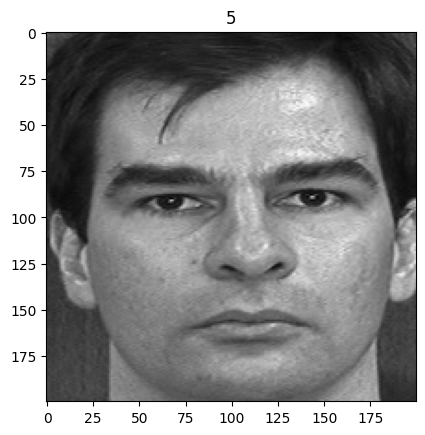

In [44]:
plt.imshow(training_data[0], cmap="gray")
plt.title(subject[0])

Text(0.5, 1.0, '1')

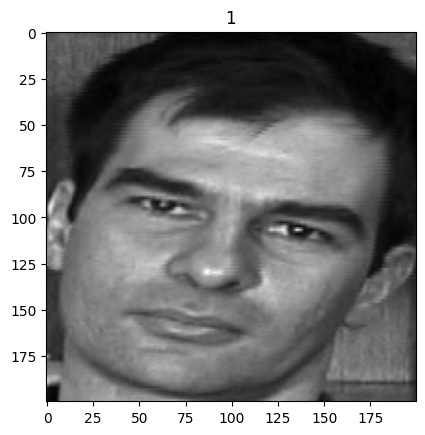

In [45]:
plt.imshow(testing_data[0], cmap="gray")
plt.title(subjects_test[0])

# Aula 4

In [46]:
import numpy as np

In [47]:
subjects = np.asarray(subjects, dtype=np.int32)
subjects_test = np.asarray(subjects_test, dtype=np.int32)

## model_eingenfaces

- PCA

In [48]:
model_eingenfaces = cv2.face.EigenFaceRecognizer_create()
model_eingenfaces.train(training_data, subjects)

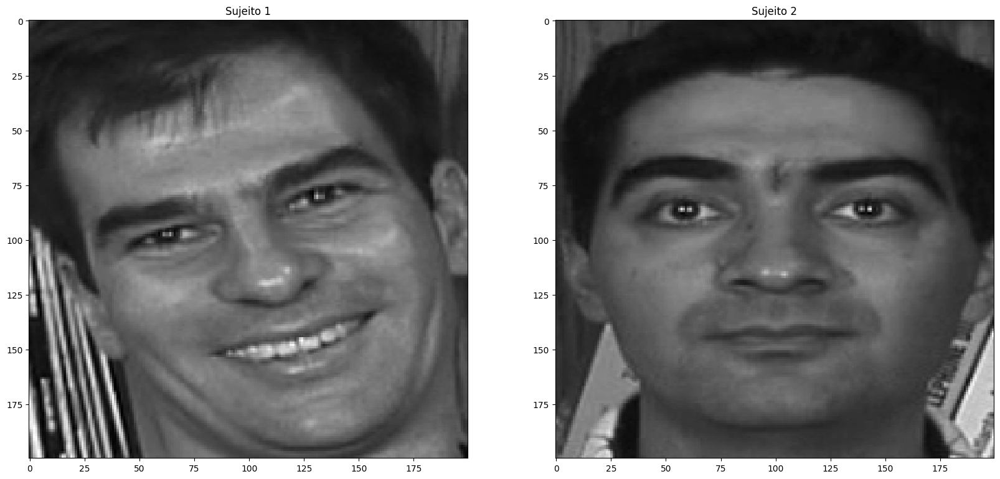

In [49]:
plt.figure(figsize=(20,10))

plt.subplot(121)
plt.title("Sujeito " + str(subjects_test[2]))
plt.imshow(testing_data[2], cmap="gray")

plt.subplot(122)
plt.title("Sujeito " + str(subjects_test[7]))
plt.imshow(testing_data[7], cmap="gray")

plt.show()

In [50]:
prediction = model_eingenfaces.predict(testing_data[2])
prediction

(1, 5343.508896779239)

In [51]:
prediction = model_eingenfaces.predict(testing_data[7])
prediction

(2, 3820.568961327711)

## model_fisherfaces

- LDA

In [52]:
model_fisherfaces = cv2.face.FisherFaceRecognizer_create()
model_fisherfaces.train(training_data, subjects)

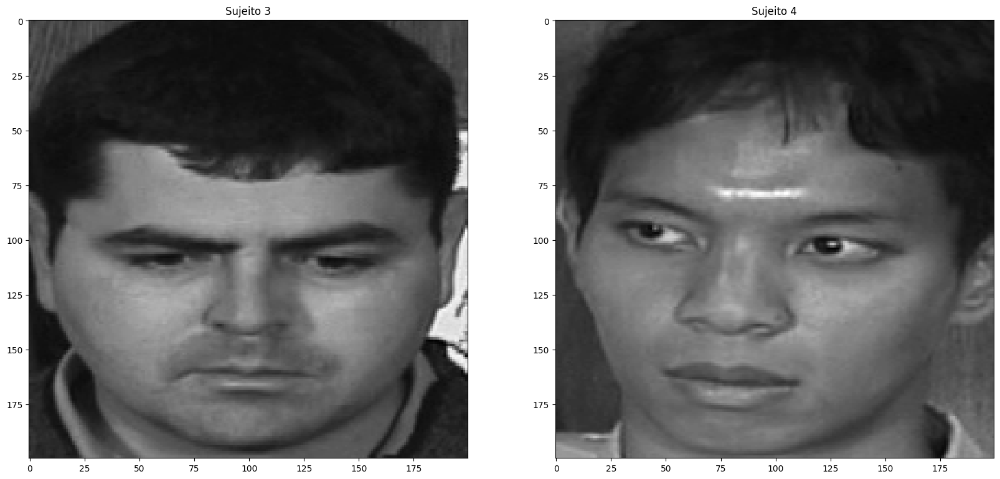

In [53]:
plt.figure(figsize=(20,10))

plt.subplot(121)
plt.title("Sujeito " + str(subjects_test[13]))
plt.imshow(testing_data[13], cmap="gray")

plt.subplot(122)
plt.title("Sujeito " + str(subjects_test[19]))
plt.imshow(testing_data[19], cmap="gray")

plt.show()

In [54]:
prediction = model_fisherfaces.predict(testing_data[13])
prediction

(3, 891.0556911562242)

In [55]:
prediction = model_fisherfaces.predict(testing_data[19])
prediction

(4, 795.8141011674627)

## Classificador LBPH

- construção do vetor de características

In [56]:
model_lbph = cv2.face.LBPHFaceRecognizer_create()
model_lbph.train(training_data, subjects)

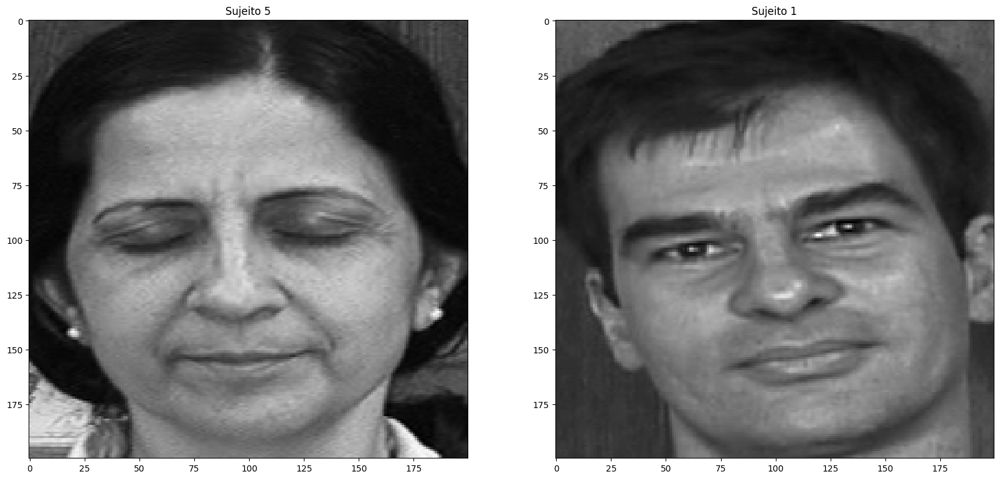

In [57]:
plt.figure(figsize=(20,10))

plt.subplot(121)
plt.title("Sujeito " + str(subjects_test[21]))
plt.imshow(testing_data[21], cmap="gray")

plt.subplot(122)
plt.title("Sujeito " + str(subjects_test[1]))
plt.imshow(testing_data[1], cmap="gray")

plt.show()

In [58]:
prediction = model_lbph.predict(testing_data[21])
prediction

(5, 32.938584374874814)

In [59]:
prediction = model_lbph.predict(testing_data[1])
prediction

(1, 34.37813417083789)

## Precisão dos algoritmos

In [60]:
from sklearn.metrics import accuracy_score

In [61]:
y_pred_eingenfaces = []

for item in testing_data:
    label, confidence = model_eingenfaces.predict(item)
    y_pred_eingenfaces.append(label)

acc_eingenfaces = accuracy_score(subjects_test, y_pred_eingenfaces)
acc_eingenfaces

0.724

In [62]:
y_pred_fisherfaces = []

for item in testing_data:
    label, confidence = model_fisherfaces.predict(item)
    y_pred_fisherfaces.append(label)

acc_fisherfaces = accuracy_score(subjects_test, y_pred_fisherfaces)
acc_fisherfaces

0.52

In [63]:
y_pred_lbph = []

for item in testing_data:
    label, confidence = model_lbph.predict(item)
    y_pred_lbph.append(label)

acc_lbph = accuracy_score(subjects_test, y_pred_lbph)
acc_lbph

0.792

# Aula 5

dblib

https://dlib.net/

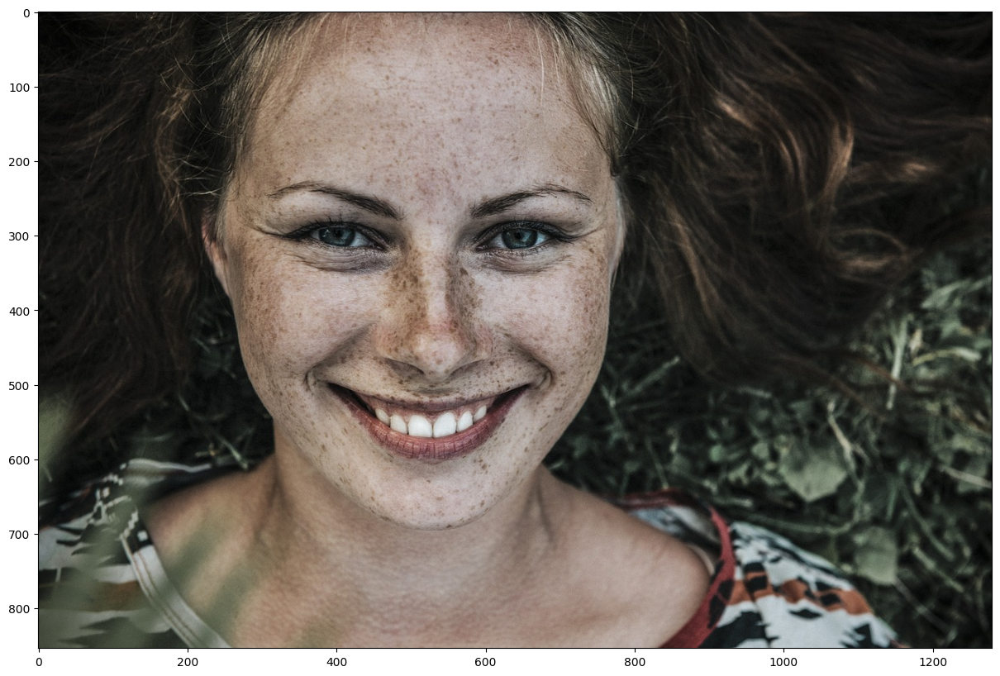

In [64]:
image = cv2.imread("images/px-woman-smilings.jpg")
image_rbg = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

plt.figure(figsize=(20,10))
plt.imshow(image_rbg)

In [65]:
classifier_dlib_68 = "classifiers/shape_predictor_68_face_landmarks.dat"
classifier_dlib_68 = dlib.shape_predictor(classifier_dlib_68)
detector_face = dlib.get_frontal_face_detector()

In [66]:
def draw_rectangle_on_face(image):
    rectangles = detector_face(image, 1)

    if len(rectangles) == 0:
        return None
    
    for k, d in enumerate(rectangles):
        print("Identificado rosto " + str(k))
        cv2.rectangle(image, (d.left(), d.top()), (d.right(), d.bottom()), (255, 255, 0), 2)

    return image

In [67]:
image_noted = image_rbg.copy()
image_noted = draw_rectangle_on_face(image_noted)

Identificado rosto 0


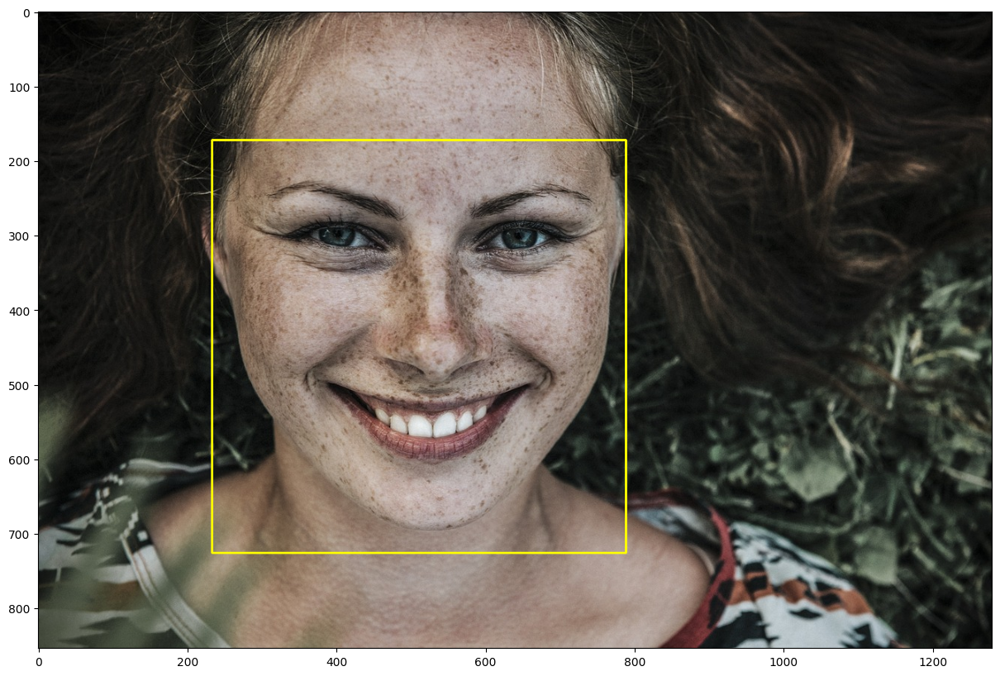

In [68]:
plt.figure(figsize=(20,10))
plt.imshow(image_noted)

Extração dos marcos faciais

In [69]:
def get_facial_landmarks_points(image):
    rectangles = detector_face(image, 1)

    if len(rectangles) == 0:
        return None

    landmarks_points = []

    for rect in rectangles:
        landmarks_points.append(np.matrix([[p.x, p.y] for p in classifier_dlib_68(image, rect).parts()]))

    return landmarks_points

In [70]:
facial_landmarks = get_facial_landmarks_points(image_rbg)

In [71]:
len(facial_landmarks)

1

In [72]:
len(facial_landmarks[0])

68

In [73]:
def draw_facial_landmarks_points(image, landmarks):

    for landmark in landmarks:
        for idx, point in enumerate(landmark):
            center = (point[0,0], point[0,1])
            cv2.circle(image, center, 3, (255, 255, 0), -1)
            cv2.putText(image, str(idx), center, cv2.FONT_HERSHEY_SIMPLEX, 0.8, (255, 255, 255), 2)
    
    return image

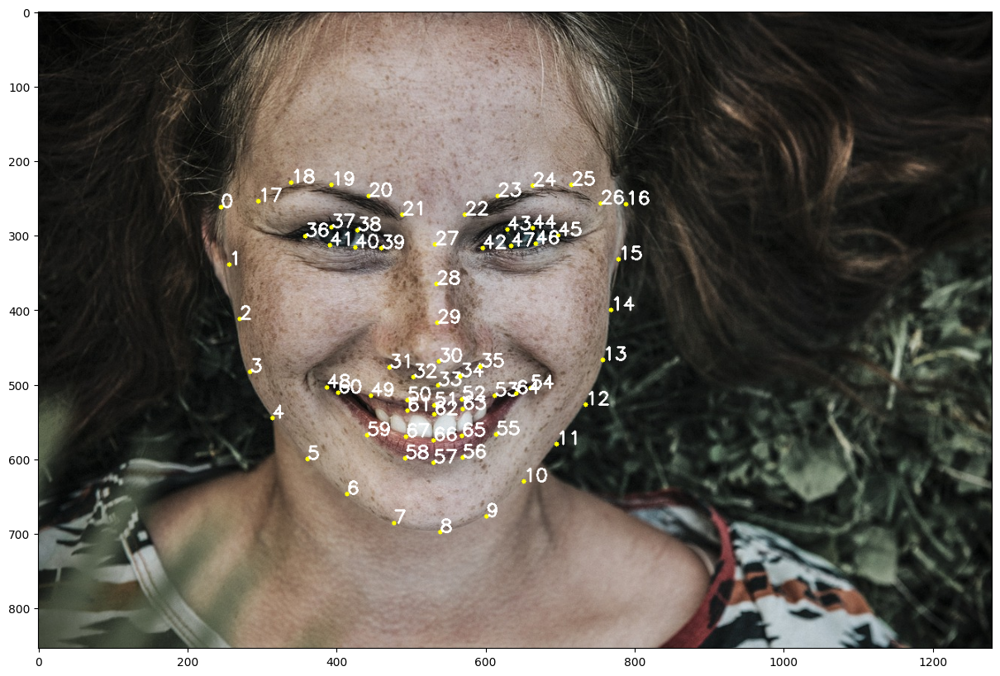

In [74]:
image_noted = image_rbg.copy()
image_noted = draw_facial_landmarks_points(image_noted, facial_landmarks)
plt.figure(figsize=(20,10))
plt.imshow(image_noted)

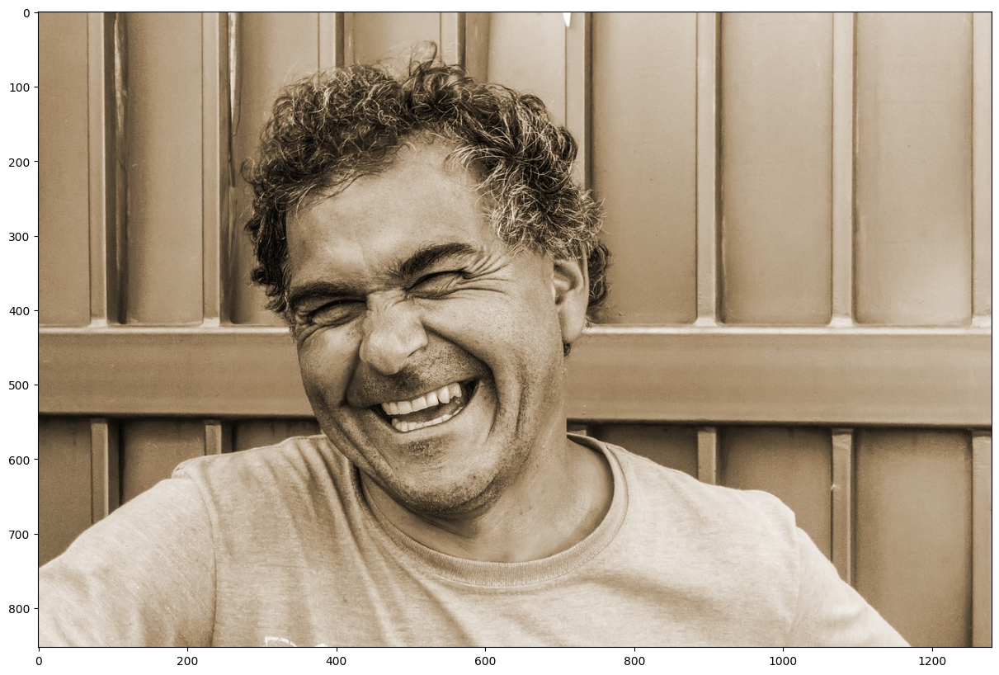

In [78]:
image_man = cv2.imread("images/px-man-happy.jpg")
image_man = cv2.cvtColor(image_man, cv2.COLOR_BGR2RGB)
plt.figure(figsize=(20,10))
plt.imshow(image_man)

In [79]:
image_note = image_man.copy()
facial_landmarks = get_facial_landmarks_points(image_note)
image_note = draw_facial_landmarks_points(image_note, facial_landmarks)

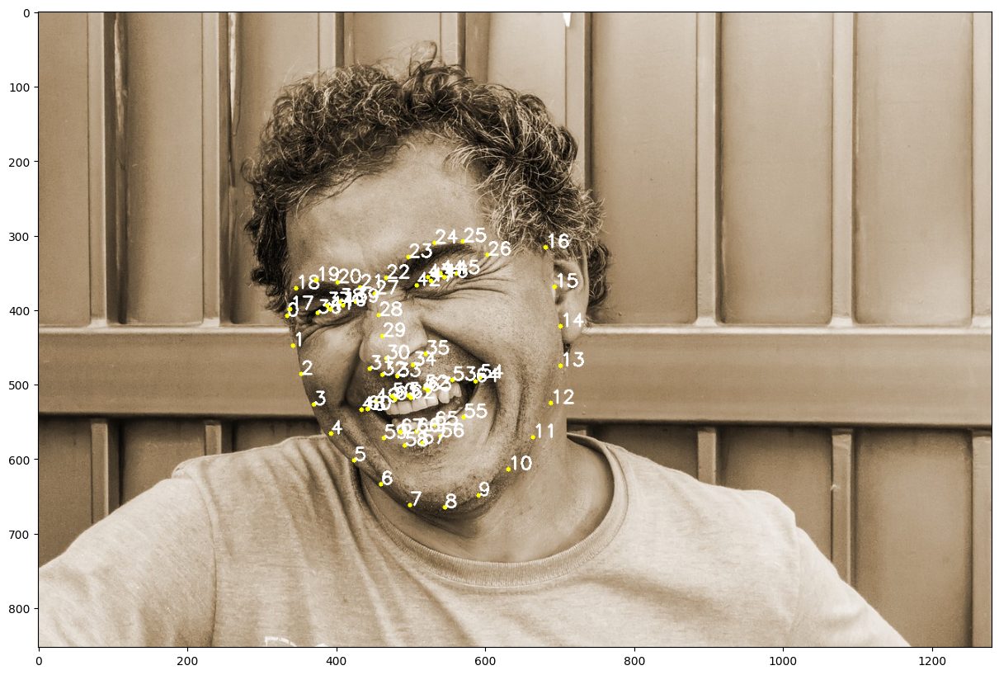

In [80]:
plt.figure(figsize=(20,10))
plt.imshow(image_note)

Medidas de aspecto de razão

In [82]:
from scipy.spatial import distance as dist

In [84]:
FACE = list(range(17, 68))
FACE_COMPLETE = list(range(0, 68))
LIP = list(range(48, 61))
EYEBROWS_RIGHT = list(range(17, 22))
EYEBROWS_LEFT = list(range(22, 27))
EYE_RIGHT = list(range(36,42))
EYE_LEFT = list(range(42,48))
NOSE = list(range(27,35))
JAW = list(range(0,17))  # mandíbula

In [93]:
def aspect_reason_eyes(eyes_landmarks):
    
    eyes_landmarks = np.array(eyes_landmarks).reshape(-1, 2)

    a = dist.euclidean(eyes_landmarks[1], eyes_landmarks[5])
    b = dist.euclidean(eyes_landmarks[2], eyes_landmarks[4])
    c = dist.euclidean(eyes_landmarks[0], eyes_landmarks[3])
    
    aspect_reason = (a + b)/(2.0 * c)
    
    return aspect_reason

In [90]:
def annotate_convex_shell_frames(image, landmarks):
    rectangles = detector_face(image, 1)
    
    if len(rectangles) == 0:
        return None
    
    for idx, ret in enumerate(rectangles):
        landmark = landmarks[idx]
        
        points = cv2.convexHull(landmark[EYE_LEFT])
        cv2.drawContours(image, [points], 0, (0, 255, 0), 2)
        
        points = cv2.convexHull(landmark[EYE_RIGHT])
        cv2.drawContours(image, [points], 0, (0, 255, 0), 2)
    
    return image

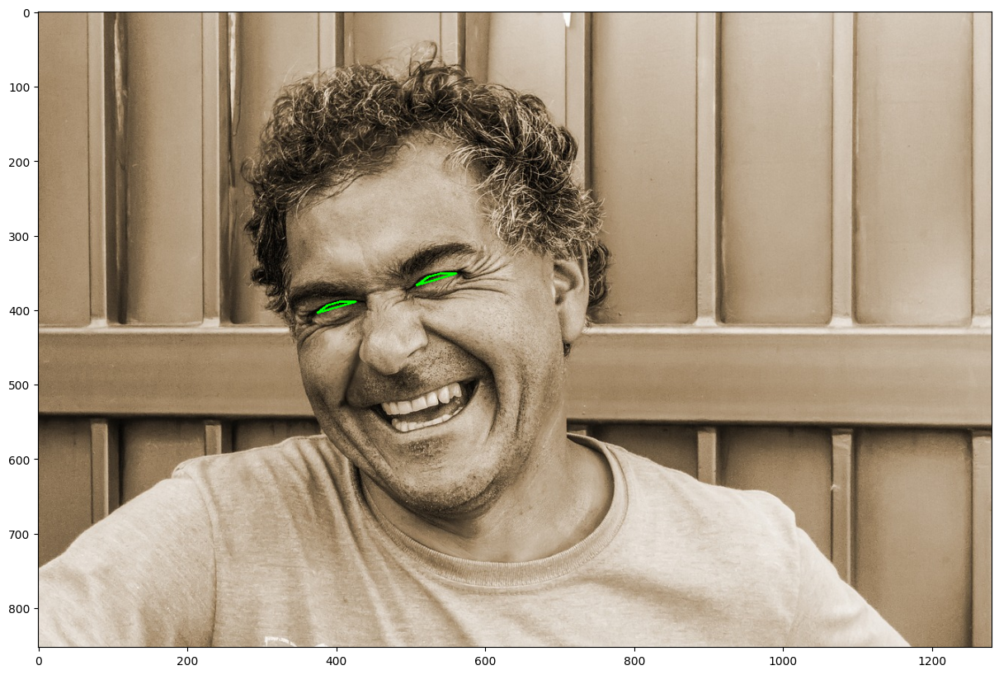

In [91]:
image_note = image_man.copy()
image_note = annotate_convex_shell_frames(image_note, facial_landmarks)
plt.figure(figsize=(20,10))
plt.imshow(image_note)

In [94]:
aspect_reason_eyes_left = aspect_reason_eyes(facial_landmarks[0][EYE_LEFT])
aspect_reason_eyes_right = aspect_reason_eyes(facial_landmarks[0][EYE_RIGHT])

print("Razão do olho esquerdo: " + str(aspect_reason_eyes_left))
print("Razão do olho direito: " + str(aspect_reason_eyes_right))

Razão do olho esquerdo: 0.12169073046467273
Razão do olho direito: 0.12044973520917499


In [96]:
image_man_2 = cv2.imread("images/px-man-serious.jpg")
image_man_2 = cv2.cvtColor(image_man_2, cv2.COLOR_BGR2RGB)

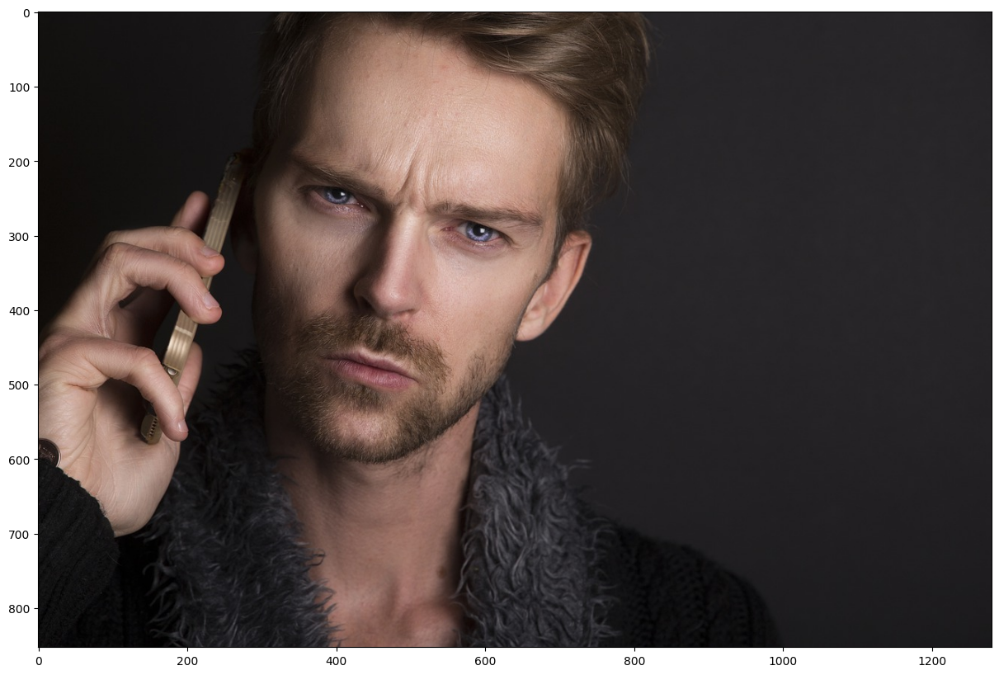

In [97]:
plt.figure(figsize=(20,10))
plt.imshow(image_man_2)

In [98]:
facial_landmarks = get_facial_landmarks_points(image_man_2)

In [100]:
image_note = image_man_2.copy()
image_note = annotate_convex_shell_frames(image_note, facial_landmarks)

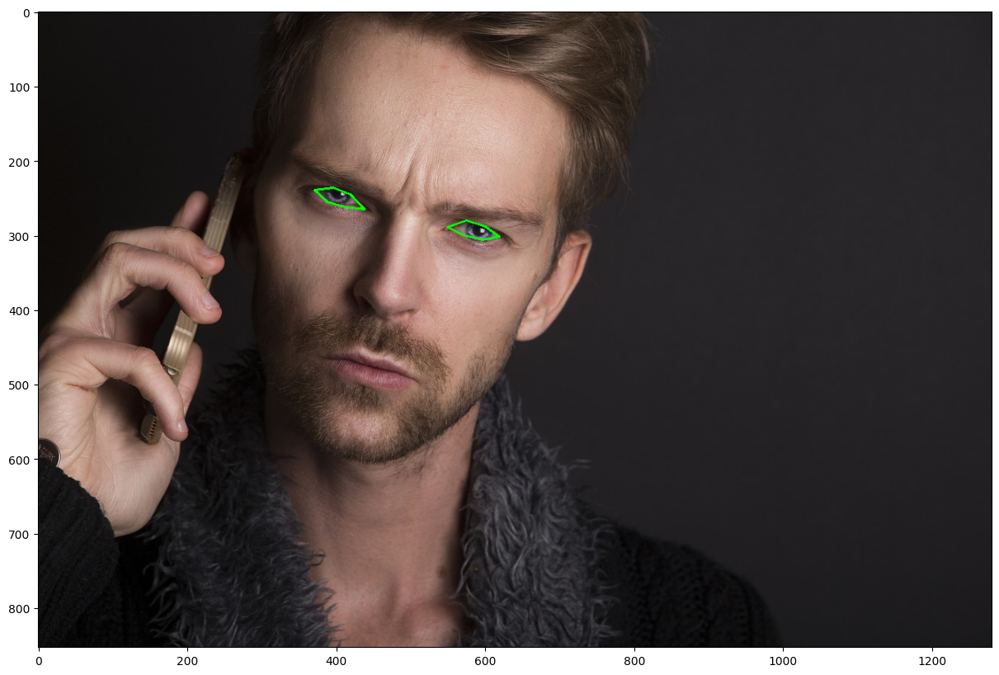

In [101]:
plt.figure(figsize=(20,10))
plt.imshow(image_note)

In [102]:
aspect_reason_eyes_left = aspect_reason_eyes(facial_landmarks[0][EYE_LEFT])
aspect_reason_eyes_right = aspect_reason_eyes(facial_landmarks[0][EYE_RIGHT])

print("Razão do olho esquerdo: " + str(aspect_reason_eyes_left))
print("Razão do olho direito: " + str(aspect_reason_eyes_right))

Razão do olho esquerdo: 0.2715204726310253
Razão do olho direito: 0.27133313866169434


# Aula 6

In [103]:
from io import BytesIO
from IPython.display import clear_output, Image, display
from PIL import Image as Img

In [104]:
def standardize_image(frame):
    frame = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
    frame = cv2.resize(frame, (500, 400))
    return frame

In [105]:
def display_video(frame):
    img = Img.fromarray(frame, "RGB")
    buffer = BytesIO()
    img.save(buffer, format="JPEG")
    display(Image(data=buffer.getvalue()))
    clear_output(wait=True)

In [106]:
video = cv2.VideoCapture("videos/expressoes.mov")

try:
    while(True):
        capture_ok, frame = video.read()
        if capture_ok:
            frame = standardize_image(frame)
            display_video(frame)
except KeyboardInterrupt:
    video.release()
    print("Interrompido")

Interrompido


In [110]:
def aspect_reason_mouth(landmarks_mouth):

    landmarks_mouth = np.array(landmarks_mouth).reshape(-1, 2)

    a = dist.euclidean(landmarks_mouth[3], landmarks_mouth[9])
    b = dist.euclidean(landmarks_mouth[2], landmarks_mouth[10])
    c = dist.euclidean(landmarks_mouth[4], landmarks_mouth[8])
    d = dist.euclidean(landmarks_mouth[0], landmarks_mouth[6])
    
    aspect_reason = (a + b + c)/(3.0*d)
    
    return aspect_reason

In [112]:
try:
    aspect_reason_max = 0
    video = cv2.VideoCapture("videos/bocejo.mov")
    while(True):
        capture_ok, frame = video.read()
        if capture_ok:
            frame = standardize_image(frame)
            facial_landmarks = get_facial_landmarks_points(frame)
            
            if facial_landmarks is not None:
                aspect_reason_mouth_calculated = aspect_reason_mouth(facial_landmarks[0][LIP])
                aspect_reason_mouth_calculated = round(aspect_reason_mouth_calculated, 3)
                
                if aspect_reason_mouth_calculated > aspect_reason_max:
                    aspect_reason_max = aspect_reason_mouth_calculated
                
                info = "boca " + str(aspect_reason_mouth_calculated) + " maximo " + str(aspect_reason_max)
                
                frame = annotate_convex_shell_frames(frame, facial_landmarks)
                cv2.putText(frame, info, (20, 50), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (255,255,0), 2)
            
            display_video(frame)
            
except KeyboardInterrupt:
    video.release()
    print("Interrompido")

Interrompido


In [114]:
try:
    min_eye_left = 1
    min_eye_right = 1
    
    video = cv2.VideoCapture("videos/olhos-fechados.mov")
    
    while(True):
        capture_ok, frame = video.read()
        frame = standardize_image(frame)
        
        facial_landmarks = get_facial_landmarks_points(frame)
        
        if facial_landmarks is not None:
            aspect_reason_eyes_left = aspect_reason_eyes(facial_landmarks[0][EYE_LEFT])
            aspect_reason_eyes_right = aspect_reason_eyes(facial_landmarks[0][EYE_RIGHT])
            
            aspect_reason_eyes_left = round(aspect_reason_eyes_left, 3)
            aspect_reason_eyes_right = round(aspect_reason_eyes_right, 3)
            
            if aspect_reason_eyes_left < min_eye_left:
                min_eye_left = aspect_reason_eyes_left
                
            if aspect_reason_eyes_right < min_eye_right:
                min_eye_right = aspect_reason_eyes_right
            
            info_oe = "Olho esquerdo " + str(aspect_reason_eyes_left) + " minimo " + str(min_eye_left)
            info_od = "Olho direito " + str(aspect_reason_eyes_right) + " minimo " + str(min_eye_right)
            
            frame = annotate_convex_shell_frames(frame, facial_landmarks)
            
            cv2.putText(frame, info_oe, (20, 50), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (255,255,0), 2)
            cv2.putText(frame, info_od, (20, 80), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (255,255,0), 2)
            
        display_video(frame)
        
except KeyboardInterrupt:
    video.release()
    print("Interrompido")

Interrompido
